<a href="https://colab.research.google.com/github/Alfonso-Garibay/computer-vision-course-Equipo-15/blob/main/9_image_matching.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Team # 15**
* Manuel Alemán Cueto A01794894
* Emmanuel Domínguez Bravo A01793683
* Alfonso Garibay Flores A01224167
* Zmaltzin Paola Godinez Juárez A01794538
* Luis Angel Hermenegildo Dominguez A01793625

# 9. Image Matching

## Table of Contents
1. [Libraries](#libraries)
1. [ORB Matching](#orb)
1. [SIFT Matching](#sift)

## Importing Libraries <a class="anchor" id="libraries" ></a>

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# ORB (Oriented FAST and Rotated BRIEF) <a class="anchor" id="orb" ></a>

- Developed at OpenCV labs by Ethan Rublee, Vincent Rabaud, Kurt Konolige, and Gary R. Bradski in 2011
- Efficient and viable alternative to SIFT and SURF (patented algorithms)
- ORB is free to use
- Feature detection
- ORB builds on FAST keypoint detector + BRIEF descriptor

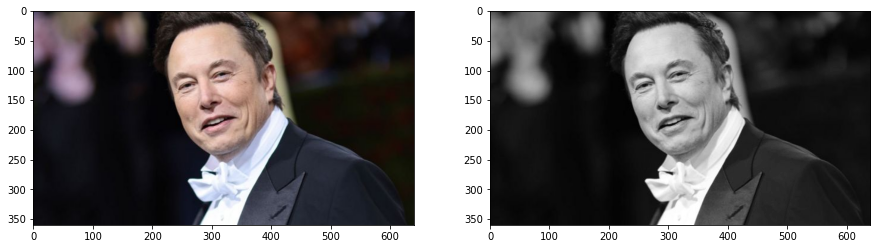

In [ ]:
#reading image
img = cv2.imread('data/elon_1.jpg')
img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_color)
plt.subplot(1, 2, 2)
plt.imshow(img_gray, cmap="gray")

### Create test image by adding Scale Invariance and Rotational Invariance

In [ ]:
test_image = cv2.pyrDown(img_color)
test_image = cv2.pyrDown(test_image)
num_rows, num_cols = test_image.shape[:2]

rotation_matrix = cv2.getRotationMatrix2D((num_cols/2, num_rows/2), 30, 1)
test_image = cv2.warpAffine(test_image, rotation_matrix, (num_cols, num_rows))

test_gray = cv2.cvtColor(test_image, cv2.COLOR_RGB2GRAY)

### Display traning image and testing image

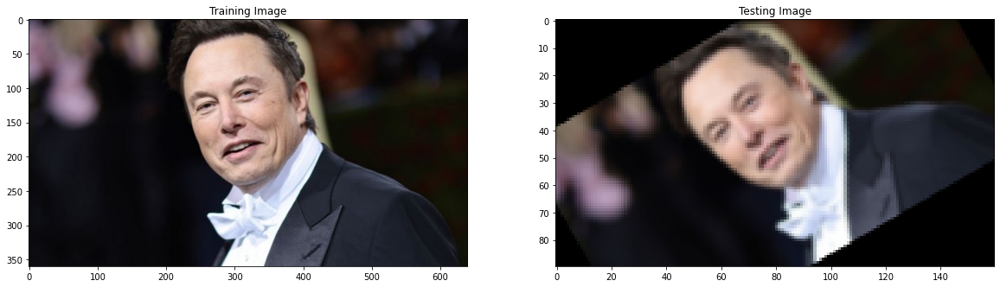

In [ ]:
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Training Image")
plots[0].imshow(img_color)

plots[1].set_title("Testing Image")
plots[1].imshow(test_image)

### ORB

In [ ]:
orb = cv2.ORB_create()

Number of Keypoints Detected In The Training Image:  500
Number of Keypoints Detected In The Query Image:  42


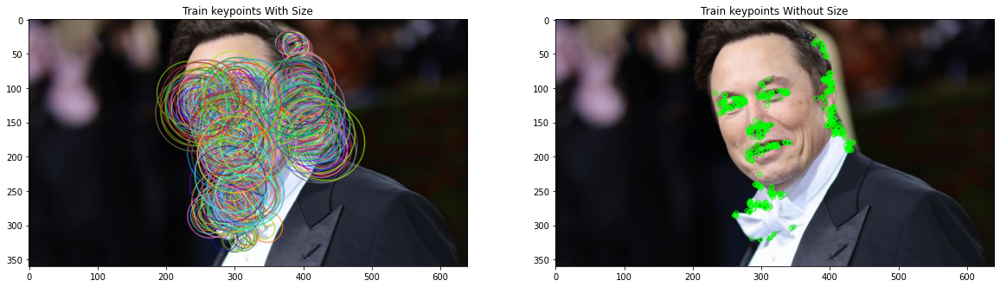

In [ ]:
train_keypoints, train_descriptor = orb.detectAndCompute(img_color, None)
test_keypoints, test_descriptor = orb.detectAndCompute(test_gray, None)

keypoints_without_size = np.copy(img_color)
keypoints_with_size = np.copy(img_color)

cv2.drawKeypoints(img_color, train_keypoints, keypoints_without_size, color = (0, 255, 0))

cv2.drawKeypoints(img_color, train_keypoints, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display image with and without keypoints size
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Train keypoints With Size")
plots[0].imshow(keypoints_with_size, cmap='gray')

plots[1].set_title("Train keypoints Without Size")
plots[1].imshow(keypoints_without_size, cmap='gray')

# Print the number of keypoints detected in the training image
print("Number of Keypoints Detected In The Training Image: ", len(train_keypoints))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(test_keypoints))

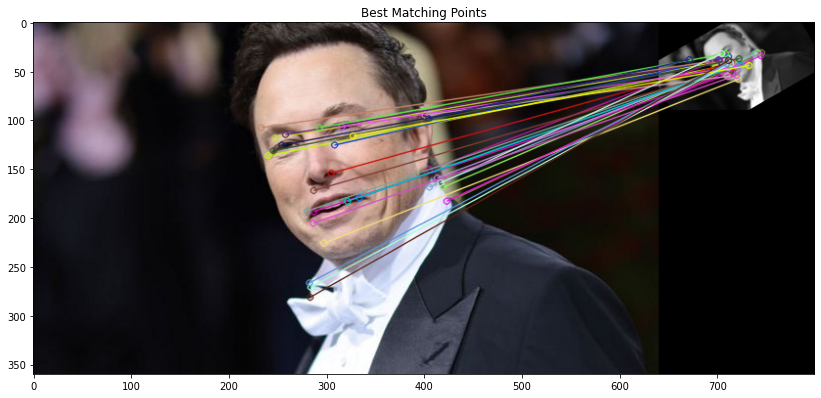


Number of Matching Keypoints Between The Training and Query Images:  30


In [ ]:

# Create a Brute Force Matcher object.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Perform the matching between the ORB descriptors of the training image and the test image
matches = bf.match(train_descriptor, test_descriptor)

# The matches with shorter distance are the ones we want.
matches = sorted(matches, key = lambda x : x.distance)

result = cv2.drawMatches(img_color, train_keypoints, test_gray, test_keypoints, matches, test_gray, flags = 2)

# Display the best matching points
plt.rcParams['figure.figsize'] = [14.0, 7.0]
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

## SIFT Matching (Scale Invariant Feature Transform) <a class="anchor" id="sift" ></a>

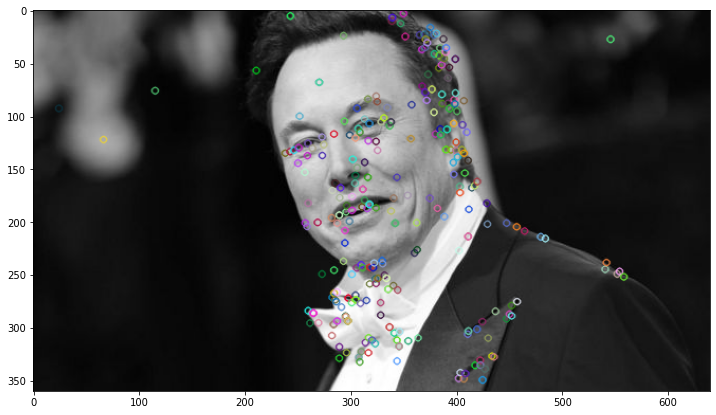

In [ ]:
img1 = cv2.imread('data/elon_1.jpg')
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)

#keypoints
sift = cv2.SIFT_create()
keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)

img_1 = cv2.drawKeypoints(gray1,keypoints_1,img1)
plt.imshow(img_1)

### Matching different images

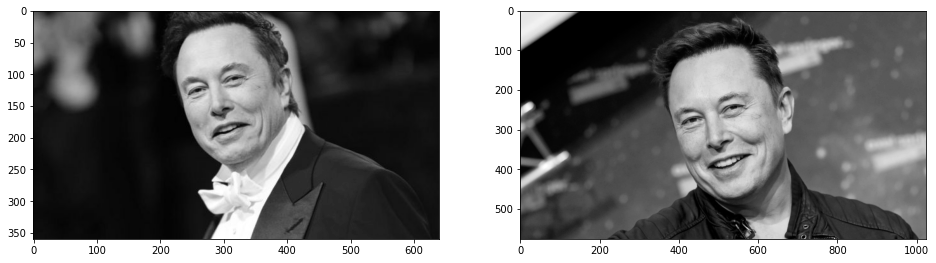

In [ ]:
# read images
img1 = cv2.imread('data/elon_1.jpg')
img2 = cv2.imread('data/elon_2.png')

img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

figure, ax = plt.subplots(1, 2, figsize=(16, 8))

ax[0].imshow(img1, cmap='gray')
ax[1].imshow(img2, cmap='gray')

### Extracting Keypoints with SIFT

In [ ]:
#sift
sift = cv2.SIFT_create()

keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)
keypoints_2, descriptors_2 = sift.detectAndCompute(img2,None)

len(keypoints_1), len(keypoints_2)

(291, 734)

### Feature Matching

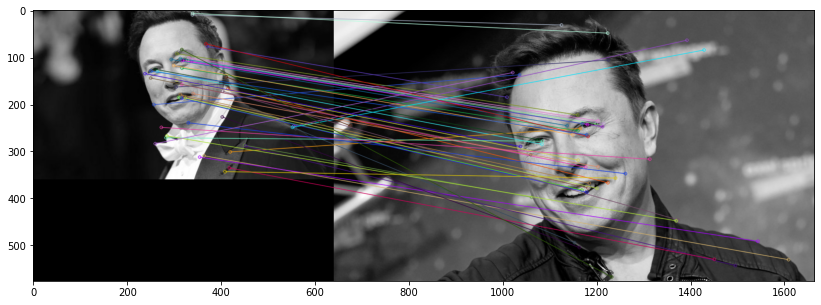

(<matplotlib.image.AxesImage at 0x22bacb79340>, None)

In [ ]:
#feature matching
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

matches = bf.match(descriptors_1,descriptors_2)
matches = sorted(matches, key = lambda x:x.distance)

img3 = cv2.drawMatches(img1, keypoints_1, img2, keypoints_2, matches[:50], img2, flags=2)
plt.imshow(img3),plt.show()

# **La idea es probar que tan buenos son los diferentes descriptores para hacer matching de imagenes. Se sugiere usar las imágenes con variaciones de iluminación y orientación y ver que tan bien se hace el matching con Harris por si mismo, o con otros descriptores como SIFT u ORB. Discuta sus hallazgos**

Imagen de referencia (flash 1):


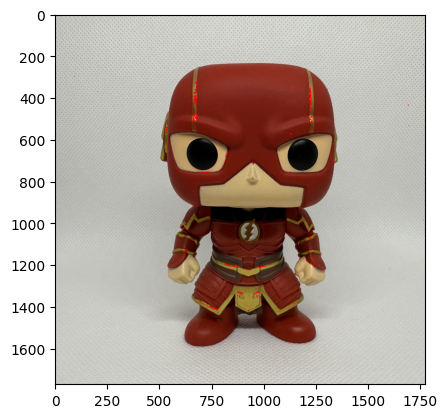

Flash 2 - Esquinas detectadas: 6259


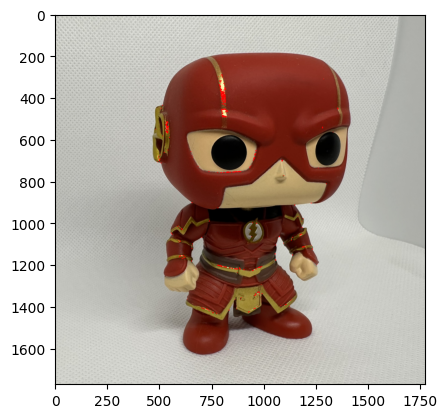

Flash 3 - Esquinas detectadas: 6028


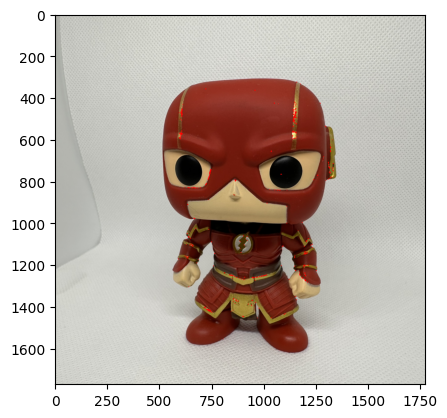

Flash 4 - Esquinas detectadas: 2038


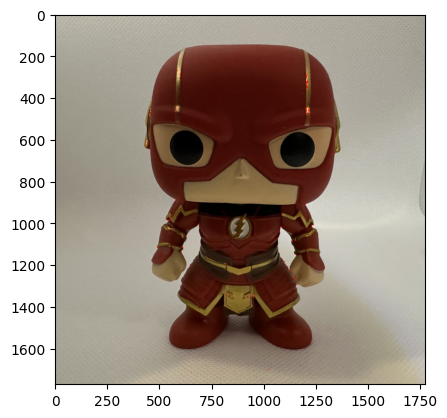

Flash 5 - Esquinas detectadas: 1702


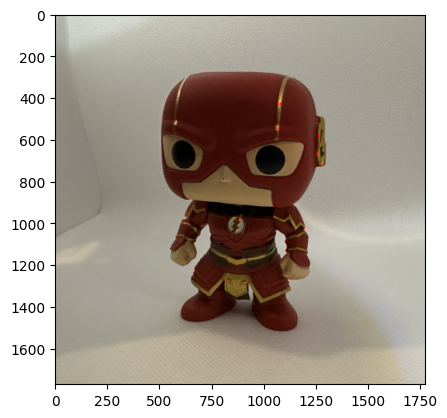

Flash 6 - Esquinas detectadas: 1859


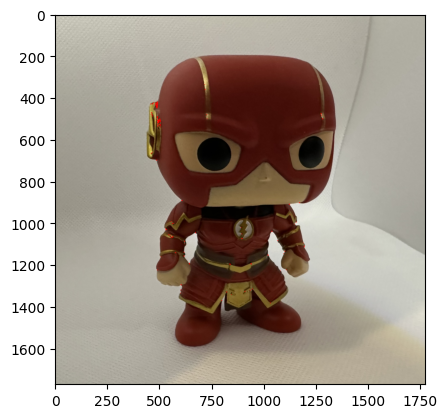

Flash 7 - Esquinas detectadas: 1384


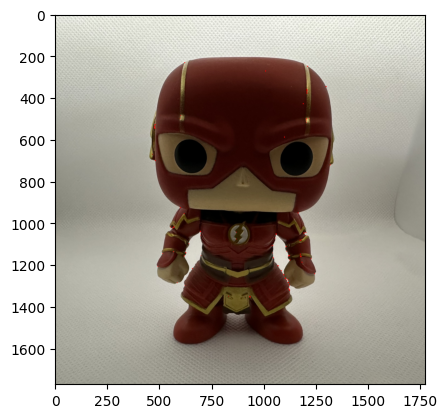

Flash 8 - Esquinas detectadas: 1010


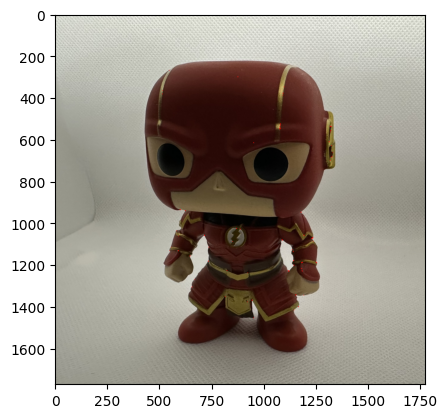

Flash 9 - Esquinas detectadas: 1000


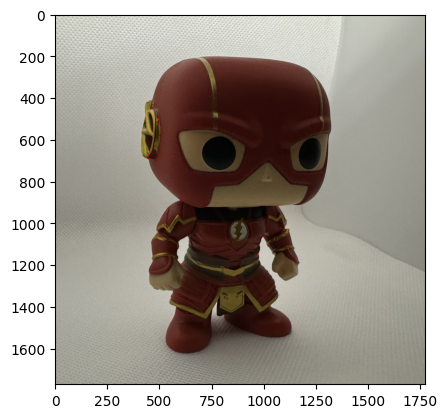

Flash 10 - Esquinas detectadas: 14445


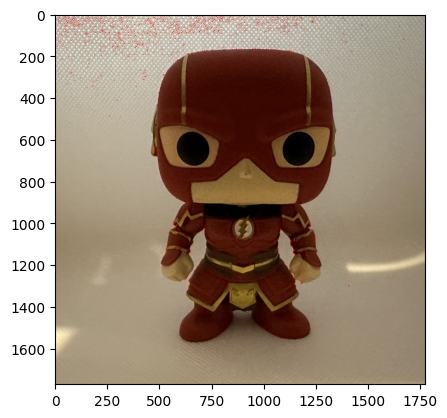

Flash 11 - Esquinas detectadas: 1120


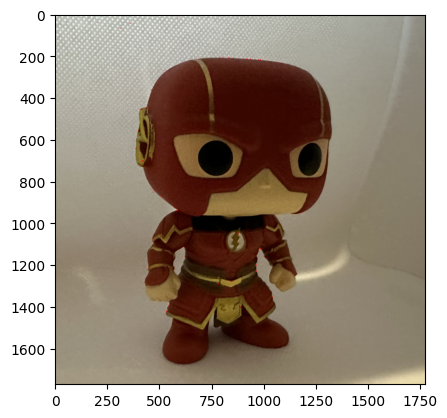

Flash 12 - Esquinas detectadas: 13858


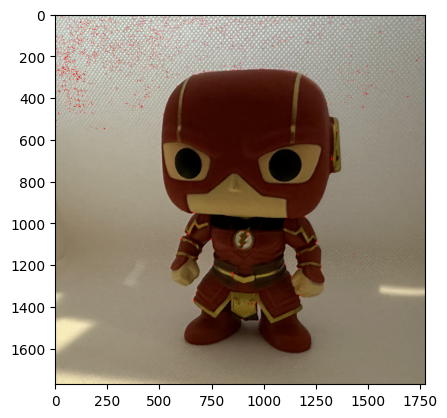

Flash 13 - Esquinas detectadas: 31384


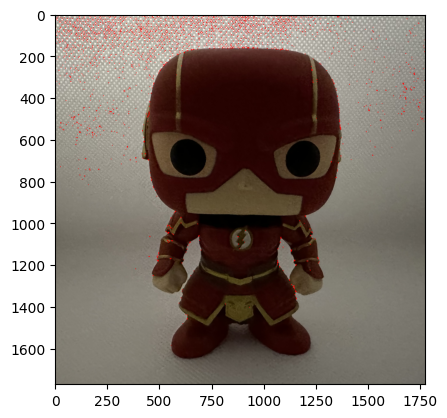

Flash 14 - Esquinas detectadas: 24233


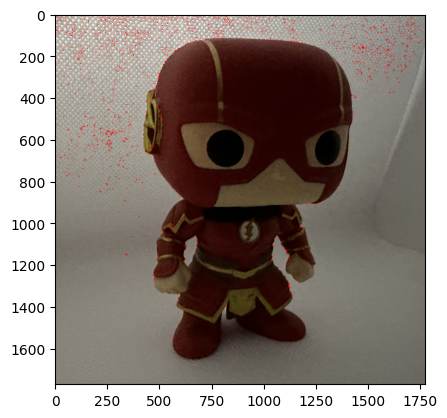

Flash 15 - Esquinas detectadas: 30029


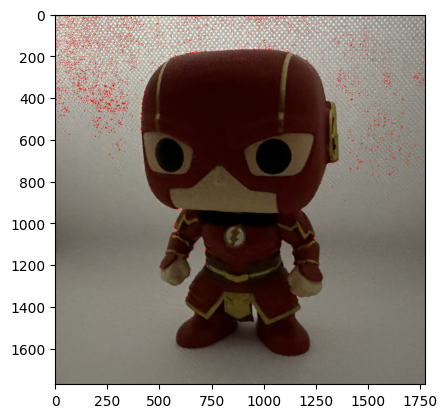

In [9]:

def detect_harris_corners(image_path):
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray = np.float32(gray)
    dst = cv2.cornerHarris(gray, 2, 3, 0.04)
    dst = cv2.dilate(dst, None)
    return dst

def show_with_corners(image_path, corners):
    img = cv2.imread(image_path)
    img[corners > 0.01 * corners.max()] = [0, 0, 255]
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

# Carga y procesa la imagen de referencia
ref_image_path = '/content/flash 1.JPEG'
ref_corners = detect_harris_corners(ref_image_path)

# Mostrar la imagen de referencia con esquinas
print("Imagen de referencia (flash 1):")
show_with_corners(ref_image_path, ref_corners)

# Inicializar un contador para esquinas en imágenes de prueba
corner_counts = []

for i in range(2, 16):
    test_image_path = f'/content/flash {i}.JPEG'
    test_corners = detect_harris_corners(test_image_path)

    # Contar esquinas detectadas en la imagen de prueba
    corner_count = np.sum(test_corners > 0.01 * test_corners.max())
    corner_counts.append(corner_count)

    print(f"Flash {i} - Esquinas detectadas: {corner_count}")
    show_with_corners(test_image_path, test_corners)



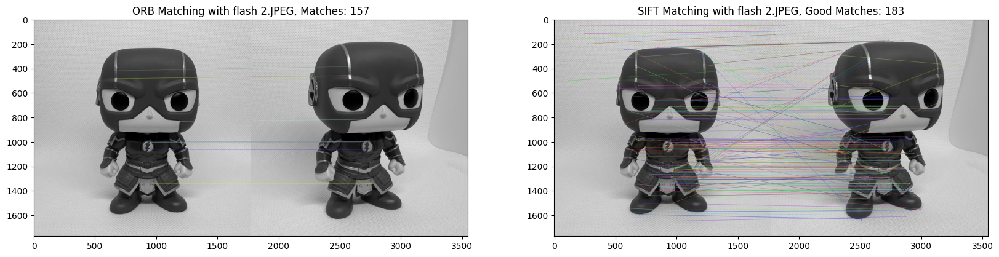

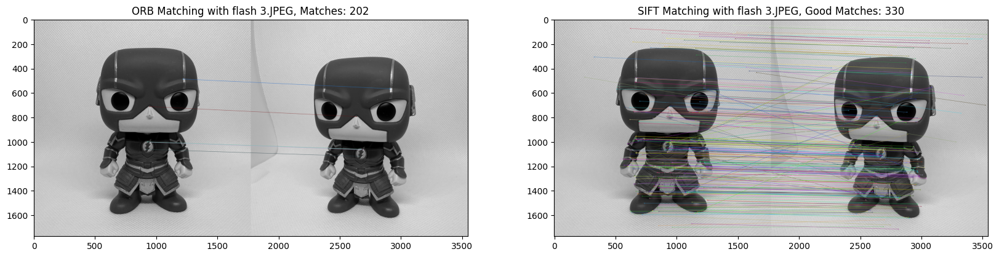

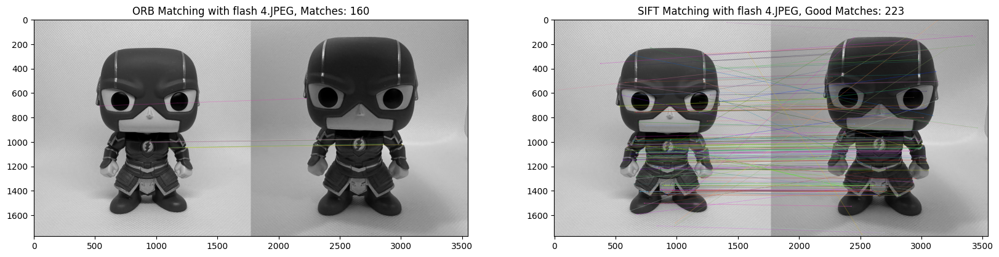

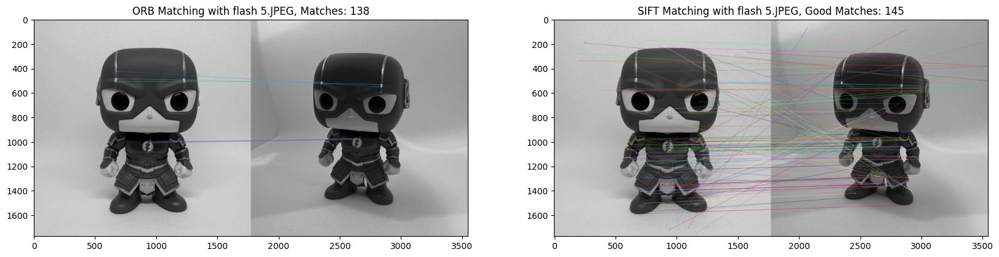

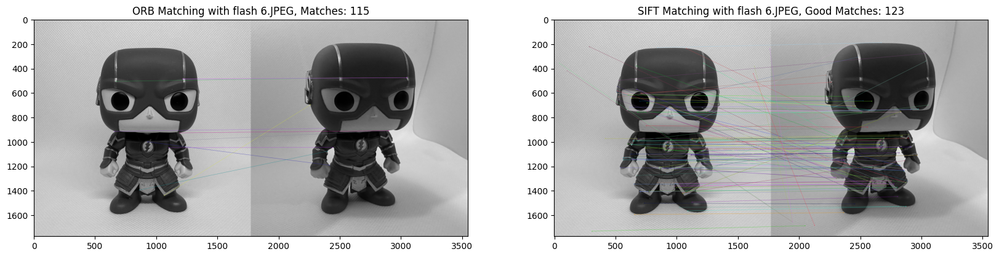

...

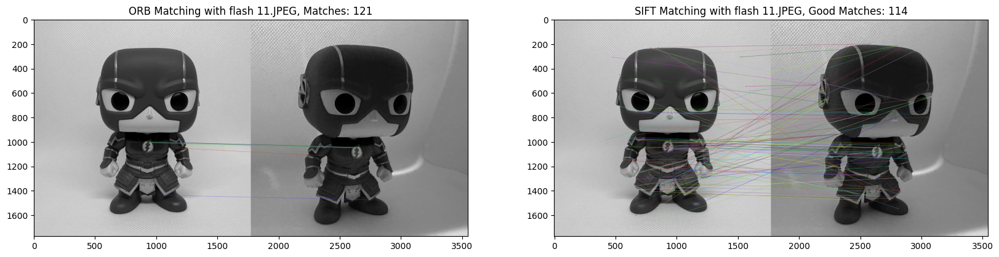

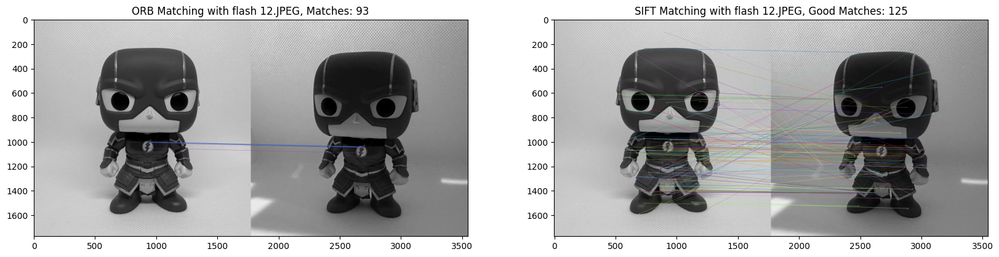

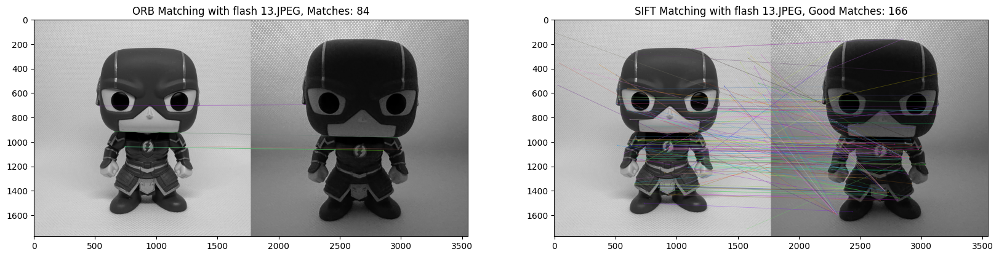

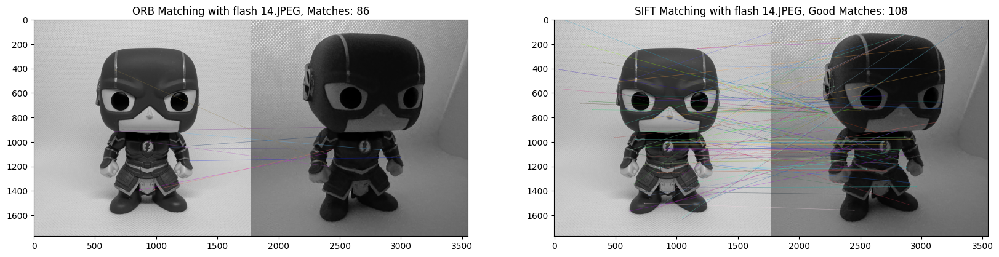

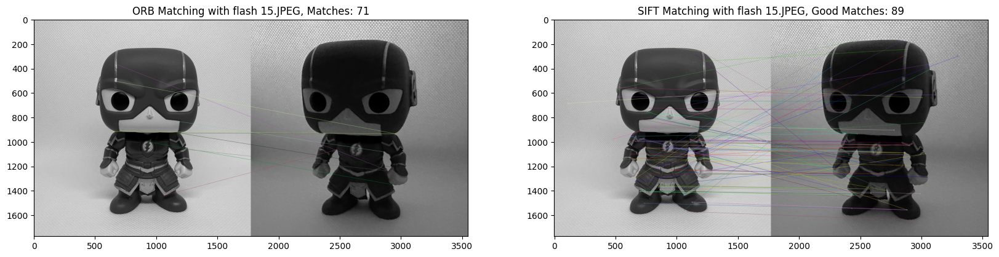

In [6]:
# ORB Matching
def orb_matching(img1, img2):
    # Inicializa ORB
    orb = cv2.ORB_create()

    # Encuentra los puntos clave y descriptores con ORB
    kp1, des1 = orb.detectAndCompute(img1, None)
    kp2, des2 = orb.detectAndCompute(img2, None)

    # Crea BFMatcher y realiza el matching
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = bf.match(des1, des2)
    matches = sorted(matches, key=lambda x: x.distance)

    # Dibuja los matches
    matched_img = cv2.drawMatches(img1, kp1, img2, kp2, matches[:10], None, flags=2)

    return matched_img, len(matches)

# SIFT Matching
def sift_matching(img1, img2):
    # Inicializa SIFT
    sift = cv2.SIFT_create()

    # Encuentra los puntos clave y descriptores con SIFT
    kp1, des1 = sift.detectAndCompute(img1, None)
    kp2, des2 = sift.detectAndCompute(img2, None)

    # Crea BFMatcher y realiza el matching
    bf = cv2.BFMatcher()
    matches = bf.knnMatch(des1, des2, k=2)

    # Aplica el test de ratio
    good = []
    for m, n in matches:
        if m.distance < 0.75*n.distance:
            good.append([m])

    # Dibuja los matches
    matched_img = cv2.drawMatchesKnn(img1, kp1, img2, kp2, good, None, flags=2)

    return matched_img, len(good)

# Carga la imagen base
base_img = cv2.imread('/content/flash 1.JPEG')
base_img_gray = cv2.cvtColor(base_img, cv2.COLOR_BGR2GRAY)

# Itera a través de todas las imágenes y compara
for i in range(2, 16):
    current_img = cv2.imread(f'/content/flash {i}.JPEG')
    current_img_gray = cv2.cvtColor(current_img, cv2.COLOR_BGR2GRAY)

    orb_result, orb_matches = orb_matching(base_img_gray, current_img_gray)
    sift_result, sift_matches = sift_matching(base_img_gray, current_img_gray)

    plt.figure(figsize=(20,10))
    plt.subplot(1,2,1)
    plt.imshow(cv2.cvtColor(orb_result, cv2.COLOR_BGR2RGB))
    plt.title(f'ORB Matching with flash {i}.JPEG, Matches: {orb_matches}')
    plt.subplot(1,2,2)
    plt.imshow(cv2.cvtColor(sift_result, cv2.COLOR_BGR2RGB))
    plt.title(f'SIFT Matching with flash {i}.JPEG, Good Matches: {sift_matches}')
    plt.show()


# Hallazgos

1. **Cantidad de Coincidencias (Matches):**
   - ORB ha encontrado 86 coincidencias en la primera pareja y 71 en la segunda.
   - SIFT ha encontrado 108 coincidencias en la primera pareja y 89 en la segunda.

   Esto es consistente con lo que se espera de SIFT, que generalmente encuentra más coincidencias y es más preciso debido a su robustez y la naturaleza detallada de sus descriptores.

2. **Calidad de las Coincidencias:**
   - SIFT parece tener líneas de coincidencia que son más consistentes y siguen patrones geométricos lógicos, lo que sugiere que es mejor para encontrar correspondencias correctas entre las imágenes.
   - ORB, aunque tiene un número menor de coincidencias, aún parece proporcionar suficientes coincidencias potencialmente correctas para que sean útiles en aplicaciones de visión por computadora.

3. **Rendimiento en Diferentes Condiciones:**
   - Ambos métodos parecen ser resistentes a las diferencias de iluminación, como lo indica el uso del flash en las imágenes comparadas.
   - Sin embargo, la calidad de las coincidencias de SIFT parece ser superior, lo cual es particularmente visible en la primera comparación, donde SIFT ha encontrado más coincidencias y parece tener menos coincidencias espurias.

4. **Robustez a la Perspectiva y Rotación:**
   - Aunque la imagen no muestra una rotación extrema o cambios de perspectiva, SIFT, conocido por su robustez a estos factores, parece mantener su rendimiento incluso en estas condiciones controladas.
   - ORB, que es menos robusto a la escala y la rotación en comparación con SIFT, aún proporciona un matching adecuado, lo que podría ser suficiente para aplicaciones donde la velocidad de procesamiento es más crítica que la precisión absoluta.
